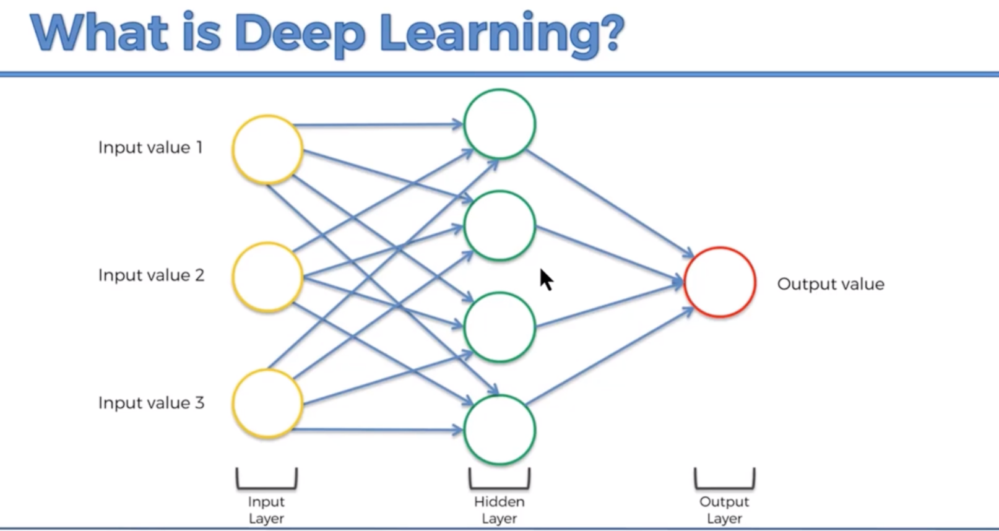

In [4]:
from IPython.display import Image
Image(filename='1.png')

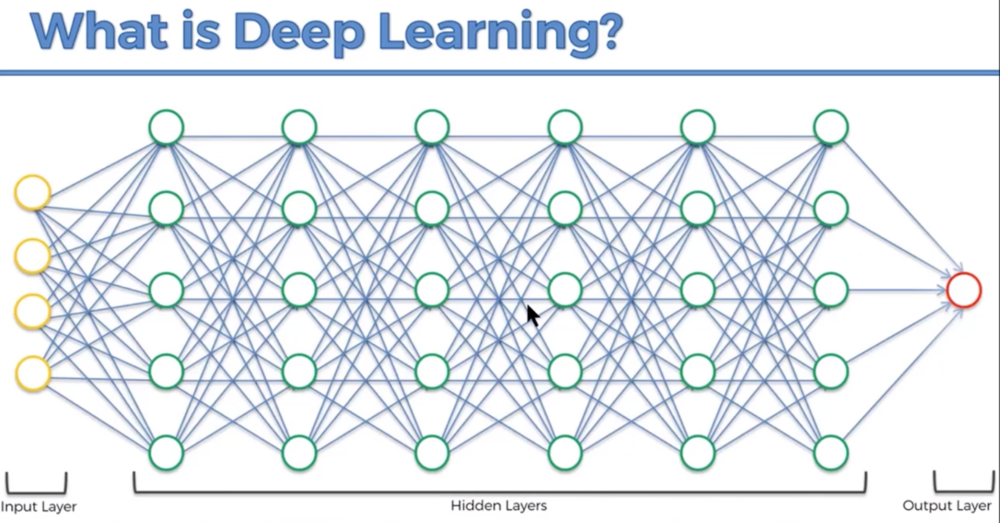

In [5]:
Image(filename='2.png')

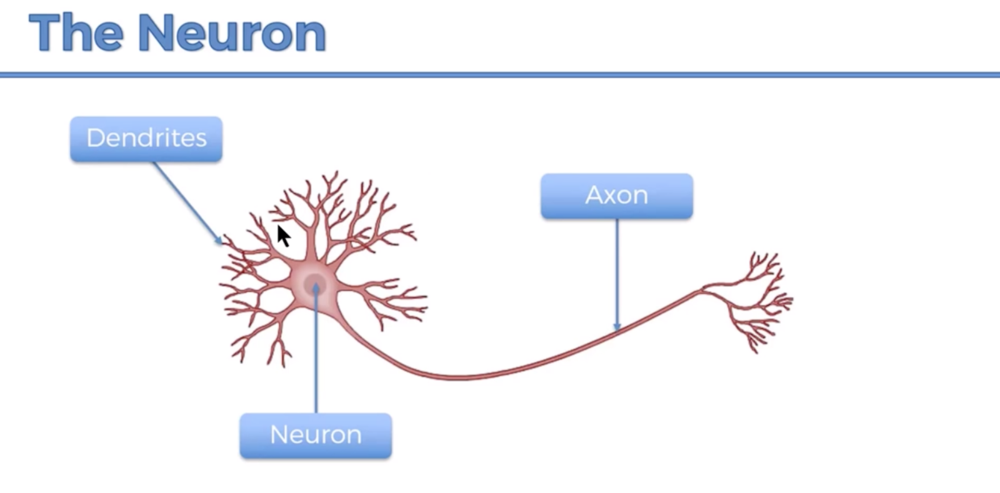

In [6]:
Image(filename='3.png')

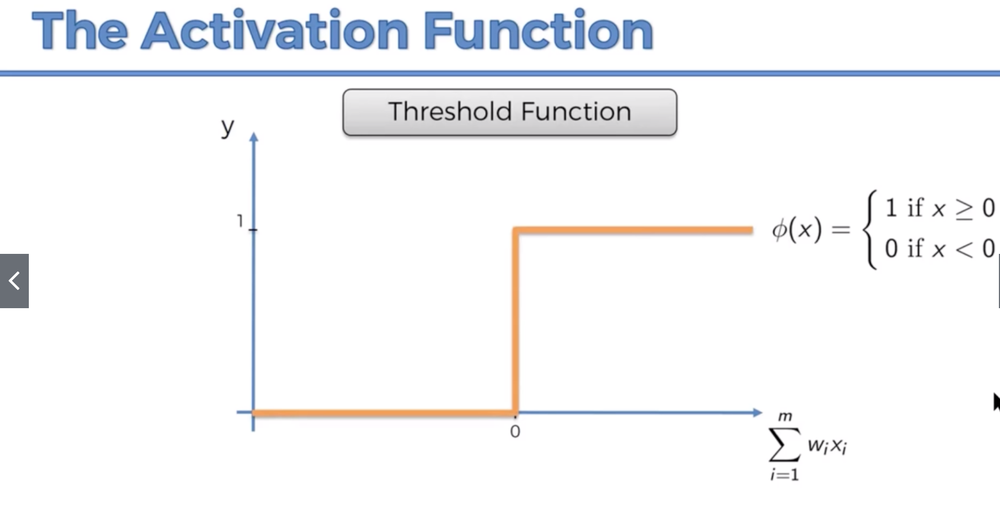

In [7]:
Image(filename='4.png')

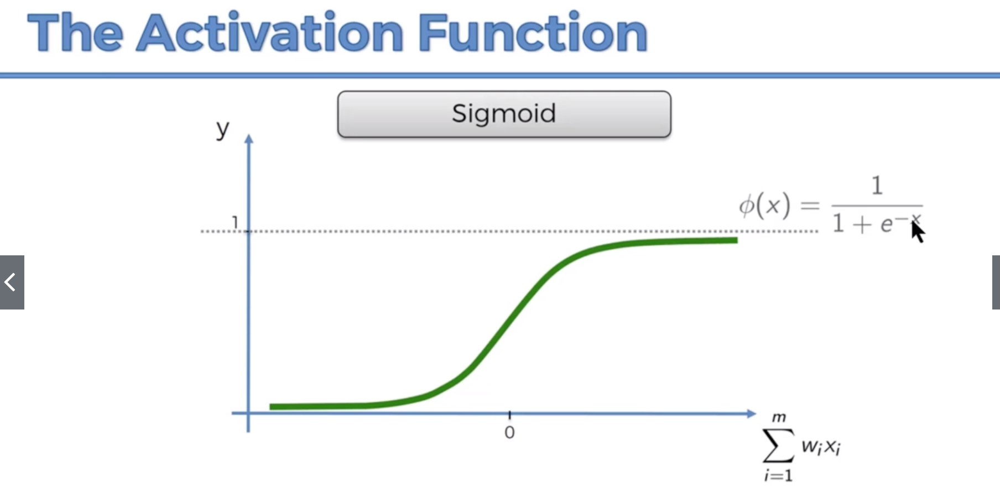

In [8]:
Image(filename='5.png')

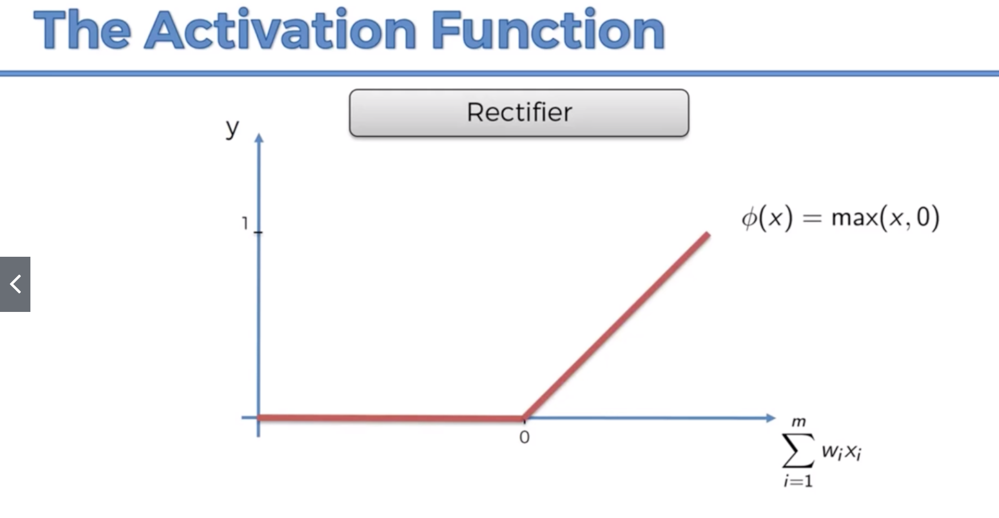

In [9]:
Image(filename='6.png')

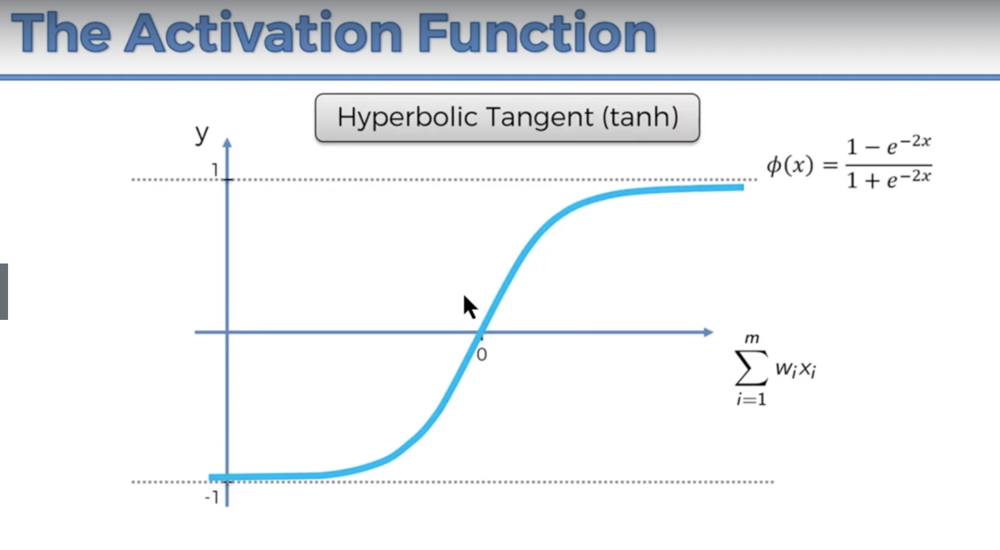

In [10]:
Image(filename='7.png')

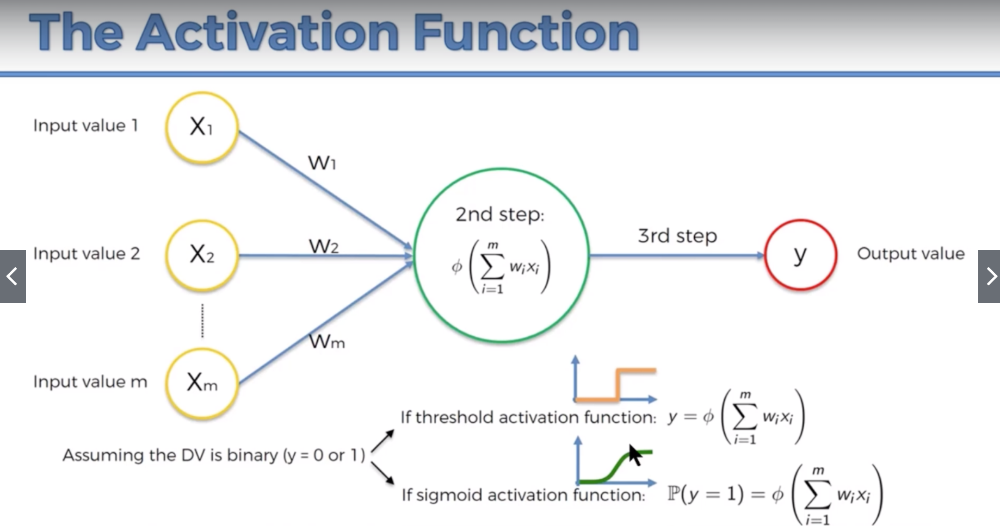

In [11]:
Image(filename='8.png')

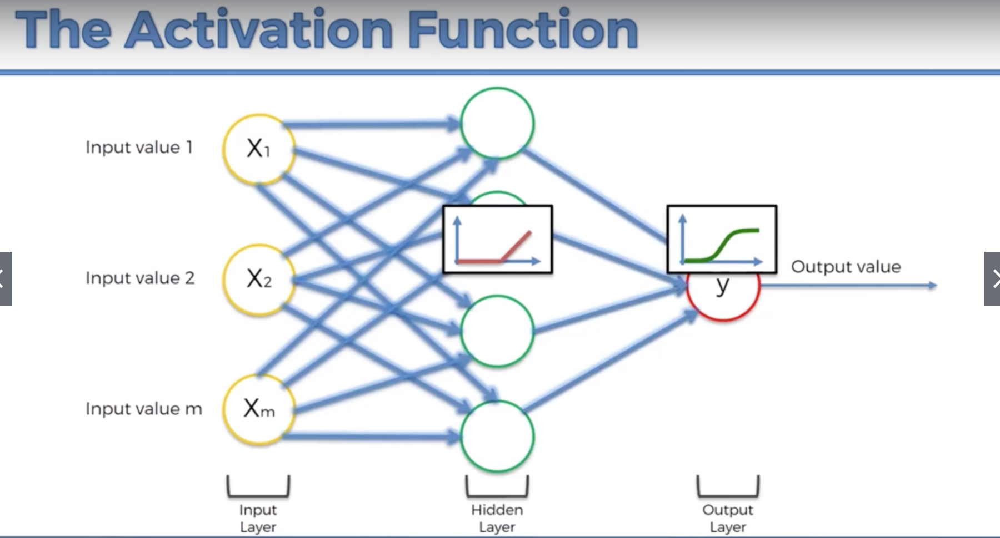

In [12]:
Image(filename='9.png')

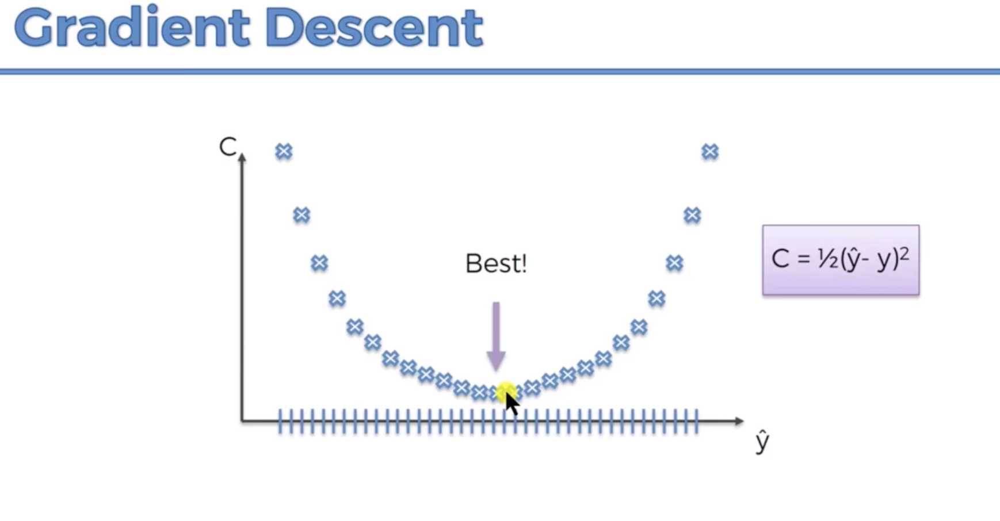

In [13]:
Image(filename='10.png')

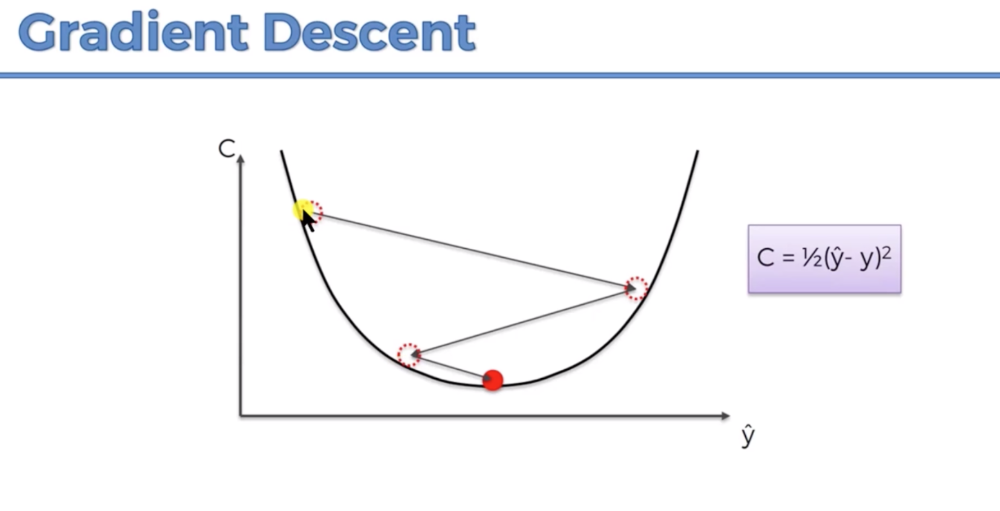

In [14]:
Image(filename='11.png')

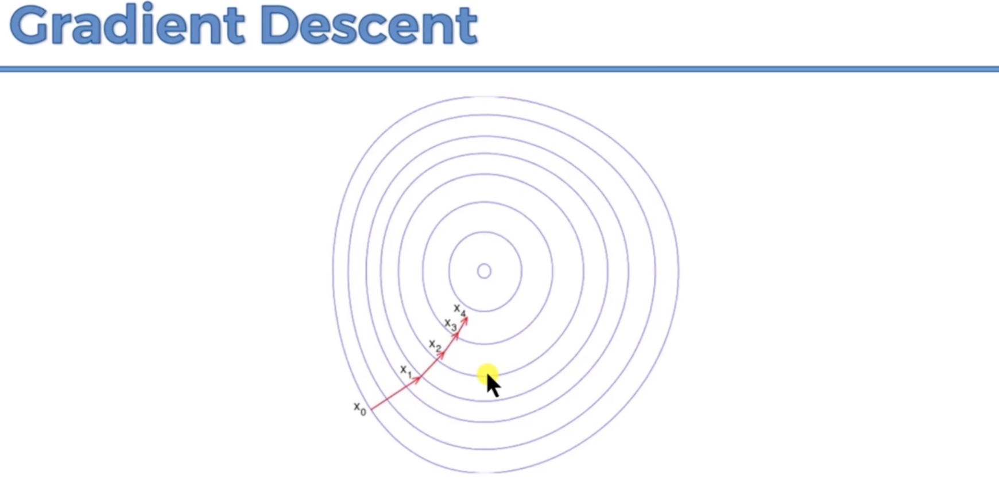

In [15]:
Image(filename='12.png')

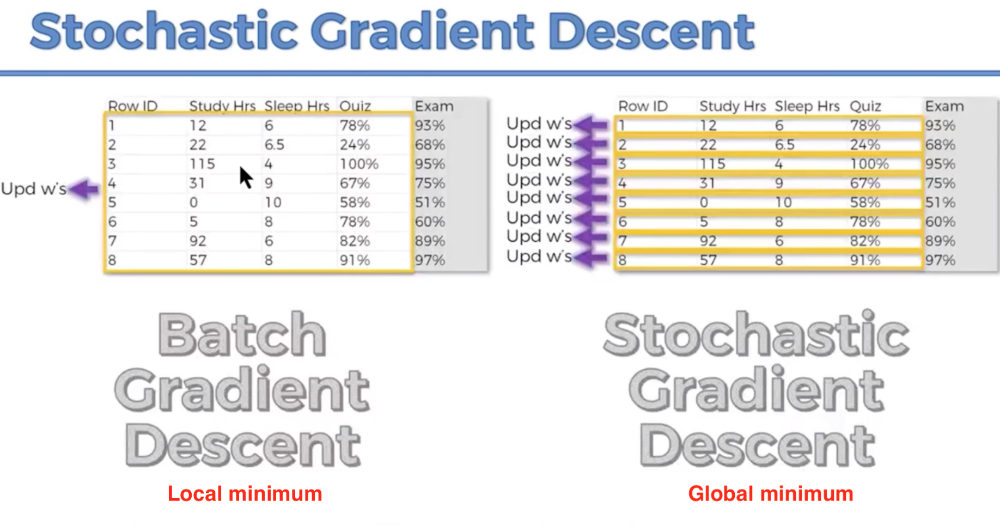

In [16]:
Image(filename='13.png')

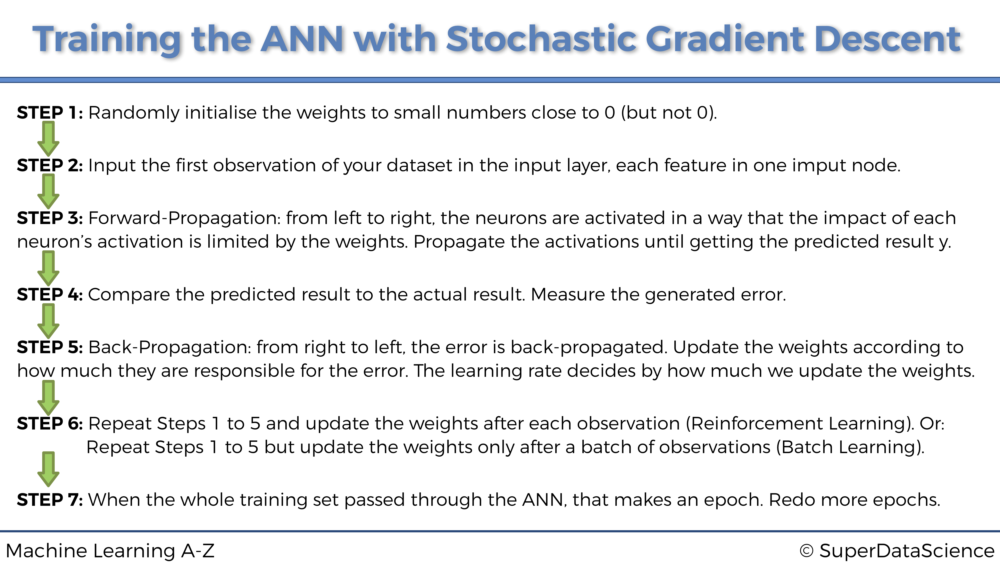

In [17]:
Image(filename='14.png')

## Sequace of the process
* 1- Importing the libraries and Dataset
* 2- Encoding categorical data and Dummy variable
* 3- Splitting the dataset into the Training set and Test set
* 4- Feature Scalling
* 5- Importing the Keras libraries and packages
* 6- prepare model for training and predict the training set


In [18]:
# Importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [19]:
# Importing the dataset
data = pd.read_csv('Churn_Modelling.csv')
data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [20]:
X = data.iloc[:,3:13].values
y = data.iloc[:,13].values

### Encoding categorical data

In [21]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
LE_X_1_2 = LabelEncoder() # Encoding catigorical data ['CustomerId','Surname']
X[:,1]= LE_X_1_2.fit_transform(X[:,1])
X[:,2]= LE_X_1_2.fit_transform(X[:,2])
X

/Users/fox/anaconda3/envs/newEnv/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/Users/fox/anaconda3/envs/newEnv/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/Users/fox/anaconda3/envs/newEnv/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


array([[619, 0, 0, ..., 1, 1, 101348.88],
       [608, 2, 0, ..., 0, 1, 112542.58],
       [502, 0, 0, ..., 1, 0, 113931.57],
       ...,
       [709, 0, 0, ..., 0, 1, 42085.58],
       [772, 1, 1, ..., 1, 0, 92888.52],
       [792, 0, 0, ..., 1, 0, 38190.78]], dtype=object)

### Dummy variable

* the second col of X have numbers for each country so we make each number in col



In [22]:
O_H_E = OneHotEncoder(categorical_features = [1])
X = O_H_E.fit_transform(X).toarray()
X

/Users/fox/anaconda3/envs/newEnv/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/Users/fox/anaconda3/envs/newEnv/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:451: DeprecationWarning: The 'categorical_features' keyword is deprecated in version 0.20 and will be removed in 0.22. You can use the ColumnTransformer instead.
  "use the ColumnTransformer instead.", DeprecationWarning)


array([[1.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.0000000e+00,
        1.0000000e+00, 1.0134888e+05],
       [0.0000000e+00, 0.0000000e+00, 1.0000000e+00, ..., 0.0000000e+00,
        1.0000000e+00, 1.1254258e+05],
       [1.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.0000000e+00,
        0.0000000e+00, 1.1393157e+05],
       ...,
       [1.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        1.0000000e+00, 4.2085580e+04],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00, ..., 1.0000000e+00,
        0.0000000e+00, 9.2888520e+04],
       [1.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.0000000e+00,
        0.0000000e+00, 3.8190780e+04]])

* take care for dummy variabel trap


In [23]:
# Remobve one variable of 3 dummy variabel for the country
X = X[:,1:]

### Splitting the dataset into the Training set and Test set


In [24]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


/Users/fox/anaconda3/envs/newEnv/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


### Feature Scaling


In [25]:
from sklearn.preprocessing import StandardScaler
F_S = StandardScaler()
X_train = F_S.fit_transform(X_train)
X_test = F_S.fit_transform(X_test)

### Importing the Keras libraries and packages


In [26]:
import keras 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

### Initialising the ANN


In [27]:
classifier = Sequential()

In [28]:
X.shape

(10000, 11)

### Adding the input layer and the first hidden layer

In [29]:
# input_dim ==> number of feature 'cols'
# output_dim ==> number of hidden layer , common way = (input_layre + output_layer)/2
#kernel_initializer ==> for initialise the random weight close to 0

# classifier.add(Dense(input_dim = 11, output_dim = 6, init = 'uniform', activation = 'sigmoid'))
# this code get error for output_dim = units
# init = kernel_initializer

classifier.add(Dense(input_dim = 11, units = 6, activation = 'relu', kernel_initializer = 'uniform'))


### Adding the input layer and the second hidden layer

In [30]:
# we didn't write the input_dim , because keras smart enough for know the number of the previous layer
classifier.add(Dense(units = 6, activation = 'relu', kernel_initializer= 'uniform'))


### Adding the output layer


In [31]:
classifier.add(Dense(units = 1, activation = 'sigmoid', kernel_initializer= 'uniform'))


### Compiling the ANN


In [32]:
# optimizer ==> edit weight on backpropagation with gradient descent or stochastic gradient descent# and 'adam' one version of SGD
# loss='binary_crossentropy' ==> for 1,2
# loss='categorical_crossentropy' ==> for 1,2,3,..
# metrics ==> for validation the correct ans
classifier.compile(optimizer= 'adam', loss='binary_crossentropy', metrics= ['accuracy'] )


### Fitting the ANN to the Training set


In [33]:
# nb_epoch = epochs
# classifier.fit(X_train, y_train, batch_size= 10, nb_epoch= 100)
classifier.fit(X_train, y_train, batch_size= 10, epochs= 100)

'''
nb_epoch = epochs  ==> One epoch means that you have trained all dataset
(all records) once,if you have 384 records,one epoch 
means that you have trained your model for all on all 384 records
'''

'''
batch_size ==> Batch size means the data you model uses on single iteration, 
in that case,128 batch size means that at once,your model takes 128 
and do some a single forward pass and backward pass(backpropation)
[This is called one iteration] .
it To break it down with this example,one iteration,
your model takes 128 records[1st batch] from your whole 384 
to be trained and do a forward pass and backward pass(back propagation).
on second batch,it takes from 129 to 256 records 
and do another iteration. 
then 3rd batch,from 256 to 384 and performs the 3rd iteration.
In this case,we say that it has completed one epoch. 
the number of epoch tells the model the number it has to repeat all those processes above then stops.
'''

Epoch 1/100
8000/8000 [==============================] - 1s 125us/sample - loss: 0.4967 - accuracy: 0.7950
Epoch 2/100
8000/8000 [==============================] - 1s 99us/sample - loss: 0.4293 - accuracy: 0.7960
Epoch 3/100
8000/8000 [==============================] - 1s 131us/sample - loss: 0.4254 - accuracy: 0.7960
Epoch 4/100
8000/8000 [==============================] - 1s 107us/sample - loss: 0.4217 - accuracy: 0.8035
Epoch 5/100
8000/8000 [==============================] - 1s 105us/sample - loss: 0.4192 - accuracy: 0.8207
Epoch 6/100
8000/8000 [==============================] - 1s 103us/sample - loss: 0.4174 - accuracy: 0.8240
Epoch 7/100
8000/8000 [==============================] - 1s 104us/sample - loss: 0.4154 - accuracy: 0.8253
Epoch 8/100
8000/8000 [==============================] - 1s 100us/sample - loss: 0.4140 - accuracy: 0.8291
Epoch 9/100
8000/8000 [==============================] - 1s 96us/sample - loss: 0.4126 - accuracy: 0.8291
Epoch 10/100
8000/8000 [===============

8000/8000 [==============================] - 1s 95us/sample - loss: 0.3999 - accuracy: 0.8336
Epoch 78/100
8000/8000 [==============================] - 1s 96us/sample - loss: 0.4004 - accuracy: 0.8355
Epoch 79/100
8000/8000 [==============================] - 1s 97us/sample - loss: 0.4005 - accuracy: 0.8347
Epoch 80/100
8000/8000 [==============================] - 1s 96us/sample - loss: 0.4000 - accuracy: 0.8363
Epoch 81/100
8000/8000 [==============================] - 1s 106us/sample - loss: 0.4003 - accuracy: 0.8342
Epoch 82/100
8000/8000 [==============================] - 1s 136us/sample - loss: 0.3999 - accuracy: 0.8353
Epoch 83/100
8000/8000 [==============================] - 1s 122us/sample - loss: 0.4000 - accuracy: 0.8334
Epoch 84/100
8000/8000 [==============================] - 1s 96us/sample - loss: 0.4002 - accuracy: 0.8342
Epoch 85/100
8000/8000 [==============================] - 1s 99us/sample - loss: 0.4001 - accuracy: 0.8361
Epoch 86/100
8000/8000 [=======================

'\nbatch_size ==> Batch size means the data you model uses on single iteration, \nin that case,128 batch size means that at once,your model takes 128 \nand do some a single forward pass and backward pass(backpropation)\n[This is called one iteration] .\nit To break it down with this example,one iteration,\nyour model takes 128 records[1st batch] from your whole 384 \nto be trained and do a forward pass and backward pass(back propagation).\non second batch,it takes from 129 to 256 records \nand do another iteration. \nthen 3rd batch,from 256 to 384 and performs the 3rd iteration.\nIn this case,we say that it has completed one epoch. \nthe number of epoch tells the model the number it has to repeat all those processes above then stops.\n'

### Predicting the Test set results


In [34]:
y_pred = classifier.predict(X_test)
y_pred

array([[0.1809153 ],
       [0.35289437],
       [0.16527766],
       ...,
       [0.1467087 ],
       [0.12794685],
       [0.08836761]], dtype=float32)

In [35]:
y_pred = y_pred > 0.5
y_pred

array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

### Making the Confusion Matrix


In [36]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
print('Traning set Accuracy = {}%'.format( ( (cm[0,0]+cm[1,1]) / cm.sum() ) *100 ) )

[[1552   43]
 [ 273  132]]
Traning set Accuracy = 84.2%


In [37]:
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [40]:
model = Sequential()

# 1st-Hidden layer
model.add(Dense(input_dim = 11, units = 6, kernel_initializer= 'uniform' , activation= 'relu'))

# 2nd- Hidden layer
model.add(Dense(units = 6, kernel_initializer= 'uniform' , activation= 'relu'))

# 3th- Hidden layer
model.add(Dense(units = 6, kernel_initializer= 'uniform' , activation= 'relu'))

# output layer
model.add(Dense(units = 1, kernel_initializer= 'uniform' , activation= 'sigmoid'))


# compile the model
model.compile(optimizer= 'adam', loss= 'binary_crossentropy', metrics = ['accuracy'])

# fit the model
model.fit(X_train, y_train, batch_size = 10, epochs = 100)



Epoch 1/100
8000/8000 [==============================] - 1s 129us/sample - loss: 0.4789 - accuracy: 0.7960
Epoch 2/100
8000/8000 [==============================] - 1s 107us/sample - loss: 0.4258 - accuracy: 0.7960
Epoch 3/100
8000/8000 [==============================] - 1s 109us/sample - loss: 0.4200 - accuracy: 0.8112
Epoch 4/100
8000/8000 [==============================] - 1s 106us/sample - loss: 0.4170 - accuracy: 0.8244
Epoch 5/100
8000/8000 [==============================] - 1s 104us/sample - loss: 0.4152 - accuracy: 0.8326
Epoch 6/100
8000/8000 [==============================] - 1s 102us/sample - loss: 0.4132 - accuracy: 0.8319
Epoch 7/100
8000/8000 [==============================] - 1s 101us/sample - loss: 0.4118 - accuracy: 0.8326
Epoch 8/100
8000/8000 [==============================] - 1s 100us/sample - loss: 0.4110 - accuracy: 0.8326
Epoch 9/100
8000/8000 [==============================] - 1s 101us/sample - loss: 0.4095 - accuracy: 0.8345
Epoch 10/100
8000/8000 [=============

8000/8000 [==============================] - 1s 102us/sample - loss: 0.4004 - accuracy: 0.8338
Epoch 77/100
8000/8000 [==============================] - 1s 101us/sample - loss: 0.4008 - accuracy: 0.8357
Epoch 78/100
8000/8000 [==============================] - 1s 99us/sample - loss: 0.4003 - accuracy: 0.8359
Epoch 79/100
8000/8000 [==============================] - 1s 100us/sample - loss: 0.4016 - accuracy: 0.8363
Epoch 80/100
8000/8000 [==============================] - 1s 99us/sample - loss: 0.4010 - accuracy: 0.8329
Epoch 81/100
8000/8000 [==============================] - 1s 100us/sample - loss: 0.4003 - accuracy: 0.8336
Epoch 82/100
8000/8000 [==============================] - 1s 101us/sample - loss: 0.4001 - accuracy: 0.8365
Epoch 83/100
8000/8000 [==============================] - 1s 101us/sample - loss: 0.4013 - accuracy: 0.8330
Epoch 84/100
8000/8000 [==============================] - 1s 101us/sample - loss: 0.4006 - accuracy: 0.8340
Epoch 85/100
8000/8000 [===================

In [42]:
y_pred = model.predict(X_test)
y_pred = y_pred > 0.5
y_pred

array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [43]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
print('Traning set Accuracy = {}%'.format( ( (cm[0,0]+cm[1,1]) / cm.sum() ) *100 ) )

[[1549   46]
 [ 276  129]]
Traning set Accuracy = 83.89999999999999%
